In [1]:
from pathlib import Path
from recursive_partitioning import *
from molecule_visualization_utils import *
import networkx as nx

MOLFILEPATH = "../test/testfiles"

# Canonicalization

## Molecule partitioning
The goal is to divide atoms in equivalence-classes / partitions.

First, sort the atoms by a fingerprint that consists of the atomic number and the atom's ring neighbors (elaborate).

initial
╒═════════╤═════════════════╤═════════════╤══════════════════════════════════════════════════════════════════════════════════════════════════════╕
│   index │ fingerprint     │   partition │ neighbors (index, fingerprint, partition)                                                            │
╞═════════╪═════════════════╪═════════════╪══════════════════════════════════════════════════════════════════════════════════════════════════════╡
│       0 │ 8-1             │           0 │ [(22, '6272622151410-1', 0), (30, '6-1', 0)]                                                         │
├─────────┼─────────────────┼─────────────┼──────────────────────────────────────────────────────────────────────────────────────────────────────┤
│       1 │ 8-1             │           0 │ [(23, '6292823171611-1', 0), (31, '6-1', 0)]                                                         │
├─────────┼─────────────────┼─────────────┼───────────────────────────────────────────────────────────────────

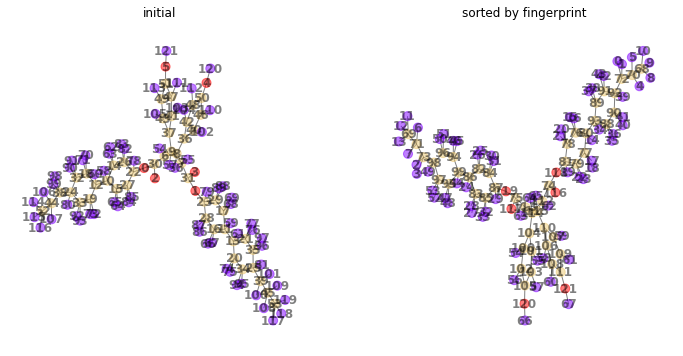

In [2]:
molecule = "CHEMBL2348759"
m = graph_from_molfile(f"{MOLFILEPATH}/{molecule}/{molecule}.mol")
m_sorted_by_fingerprint = sort_molecule_by_attribute(m, "fingerprint")
print_molecule(m, "initial")
print_molecule(m_sorted_by_fingerprint, "sorted by fingerprint")
draw_molecules([m, m_sorted_by_fingerprint], ["initial", "sorted by fingerprint"], highlight="atomic_number")

Subsequently, the molecule is partitioned by fingerprint. Elaborate.


╒═════════╤═════════════════╤═════════════╤═════════════════════════════════════════════════════════════════════════════════════════════════════════╕
│   index │ fingerprint     │   partition │ neighbors (index, fingerprint, partition)                                                               │
╞═════════╪═════════════════╪═════════════╪═════════════════════════════════════════════════════════════════════════════════════════════════════════╡
│       0 │ 1-1             │           0 │ [(72, '6-1', 11)]                                                                                       │
├─────────┼─────────────────┼─────────────┼─────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│       1 │ 1-1             │           0 │ [(72, '6-1', 11)]                                                                                       │
├─────────┼─────────────────┼─────────────┼────────────────────────────────────────────────────────

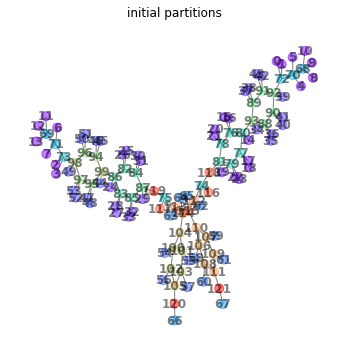

In [3]:
m_partitioned_by_fingerprint = partition_molecule_by_attribute(m_sorted_by_fingerprint, "fingerprint")
print_molecule(m_partitioned_by_fingerprint)
draw_molecules([m_partitioned_by_fingerprint], ["initial partitions"], highlight="partition")

Now, we refine the partitions recursively ("partitioning by partition"). Elaborate.

refined partitions
╒═════════╤═════════════════╤═════════════╤═════════════════════════════════════════════════════════════════════════════════════════════════════════╕
│   index │ fingerprint     │   partition │ neighbors (index, fingerprint, partition)                                                               │
╞═════════╪═════════════════╪═════════════╪═════════════════════════════════════════════════════════════════════════════════════════════════════════╡
│       0 │ 1-1             │           0 │ [(68, '6-1', 9)]                                                                                        │
├─────────┼─────────────────┼─────────────┼─────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│       1 │ 1-1             │           0 │ [(68, '6-1', 9)]                                                                                        │
├─────────┼─────────────────┼─────────────┼──────────────────────────────────────

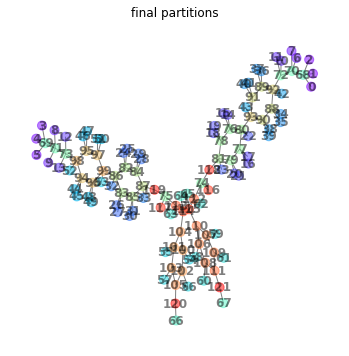

In [4]:
m_partitioned = partition_molecule_recursively(m_partitioned_by_fingerprint, show_steps=True)
draw_molecules([m_partitioned], ["final partitions"], highlight="partition")

After the recursive refinement of the partitions, many partitions contain only a few molecules. This brings us closer to the ultimate goal of the canonicalization. That is, we are closer to shattering the molecule such that each atom resides in a unique partition. How do we shatter the molecule?

## Molecule traversal

Traversing molecule deterministically by branching in a principled way based on partitions.
I.e., establish branching-priorities for situations when traversal can branch to multiple neighbors from atom A:
1. neighbor with larger partition than A
2. neighbor with smaller partition than A
3. neighbor in same partition as A

During traversal, swap indices such that the current molecule A from partition P gets assigned the smallest-available index that remains in partition P. Elaborate.

Current atom index: 0.	Re-labeling to 0.
Current atom index: 68.	Re-labeling to 68.
Current atom index: 70.	Re-labeling to 70.
Current atom index: 1.	Re-labeling to 1.
Current atom index: 2.	Re-labeling to 2.
Current atom index: 72.	Re-labeling to 72.
Current atom index: 6.	Re-labeling to 6.
Current atom index: 7.	Re-labeling to 7.
Current atom index: 92.	Re-labeling to 92.
Current atom index: 10.	Re-labeling to 10.
Current atom index: 11.	Re-labeling to 11.
Current atom index: 42.	Re-labeling to 42.
Current atom index: 88.	Re-labeling to 88.
Current atom index: 89.	Re-labeling to 89.
Current atom index: 90.	Re-labeling to 90.
Current atom index: 34.	Re-labeling to 34.
Current atom index: 35.	Re-labeling to 35.
Current atom index: 91.	Re-labeling to 91.
Current atom index: 36.	Re-labeling to 36.
Current atom index: 37.	Re-labeling to 37.
Current atom index: 93.	Re-labeling to 93.
Current atom index: 38.	Re-labeling to 38.
Current atom index: 39.	Re-labeling to 39.
Current atom index: 4

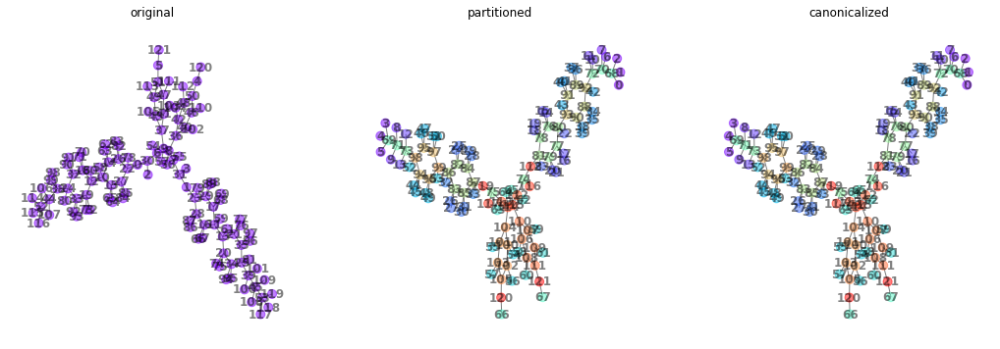

In [5]:
canonical_idcs = traverse_molecule(m_partitioned, 0, show_traversal_order=True)
m_canonicalized = nx.relabel_nodes(m_partitioned, canonical_idcs, copy=True)

draw_molecules([m, m_partitioned, m_canonicalized], ["original", "partitioned", "canonicalized"], highlight="partition")

# Invariance Test
In order to be useful for the identification of a molecule, the canonicalization must be invariant. That is, irrespective of a molecule's initial atom labels, the canonicalization should always result in the same atom labeling. Below we set up a test of invariance. 

Starting 100 runs of invariance tests for 2-8-dimethyldecane.
Starting 100 runs of invariance tests for 2-aminopyridine.
Starting 100 runs of invariance tests for acetylacetonate.
Starting 100 runs of invariance tests for ammonia.
Starting 100 runs of invariance tests for anthracene.
Starting 100 runs of invariance tests for aspartic_acid.
Starting 100 runs of invariance tests for B12H10CO2.
Starting 100 runs of invariance tests for B5H11.
Starting 100 runs of invariance tests for B5H9.
Starting 100 runs of invariance tests for B8Cl8.
Starting 100 runs of invariance tests for BeCl2.
Starting 100 runs of invariance tests for benzene.
Starting 100 runs of invariance tests for benzoic_acid.
Starting 100 runs of invariance tests for BF3.
Starting 100 runs of invariance tests for bipyridine.
Starting 100 runs of invariance tests for bis-cyclopentadiene.
Starting 100 runs of invariance tests for C60.
Starting 100 runs of invariance tests for Carboplatin.
Starting 100 runs of invariance tests

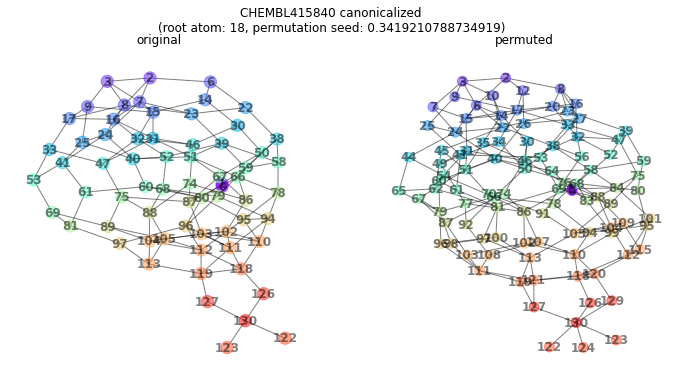

In [6]:
testfiles = list(Path(MOLFILEPATH).glob("*/*.mol"))
failed_molecules = {}
n_runs = 100

for molfile in testfiles:
    failed_test_config = test_canonicalization_invariance(molfile, n_runs=n_runs)
    if failed_test_config:
        print(f"Canonicalization resulted in different labelings for {molfile.stem}.")
        failed_molecules[molfile.stem] = failed_test_config
        
print(f"\n{len(failed_molecules)}/{len(testfiles)} failed invariance tests over {n_runs} test-runs per molecule.")

for molecule, test_config in failed_molecules.items():
    m = graph_from_molfile(f"{MOLFILEPATH}/{molecule}/{molecule}.mol")
    m_permu = permute_molecule(m, test_config.permutation_seed)
    
    m_canon = canonicalize_molecule(m, root_idx=test_config.root_atom)
    m_permu_canon = canonicalize_molecule(m_permu, root_idx=test_config.root_atom)

    draw_molecules([m_canon, m_permu_canon], ["original","permuted"], highlight="partition",
                    title=f"{molecule} canonicalized\n(root atom: {test_config.root_atom}, permutation seed: {test_config.permutation_seed})")

Starting 1 runs of invariance tests for 2-8-dimethyldecane.
Starting 1 runs of invariance tests for 2-aminopyridine.
Starting 1 runs of invariance tests for acetylacetonate.
Starting 1 runs of invariance tests for ammonia.
Starting 1 runs of invariance tests for anthracene.
Starting 1 runs of invariance tests for aspartic_acid.
Starting 1 runs of invariance tests for B12H10CO2.
Starting 1 runs of invariance tests for B5H11.
Starting 1 runs of invariance tests for B5H9.
Starting 1 runs of invariance tests for B8Cl8.
Starting 1 runs of invariance tests for BeCl2.


/workspaces/nInChI_prototype/notebooks/molecule_visualization_utils.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(n_molecules * 6, 6))


Starting 1 runs of invariance tests for benzene.
Starting 1 runs of invariance tests for benzoic_acid.
Starting 1 runs of invariance tests for BF3.
Starting 1 runs of invariance tests for bipyridine.
Starting 1 runs of invariance tests for bis-cyclopentadiene.
Starting 1 runs of invariance tests for C60.
Starting 1 runs of invariance tests for Carboplatin.
Starting 1 runs of invariance tests for Ceftobiprol.
Starting 1 runs of invariance tests for cf3alkyne.
Starting 1 runs of invariance tests for CHEMBL2348759.
Starting 1 runs of invariance tests for CHEMBL415840.
Starting 1 runs of invariance tests for cisplatin.
Starting 1 runs of invariance tests for Cortisol.
Starting 1 runs of invariance tests for CrCO3benzene.
Starting 1 runs of invariance tests for CrCO6.
Starting 1 runs of invariance tests for cyclobutane.
Starting 1 runs of invariance tests for cyclohexane.
Starting 1 runs of invariance tests for cyclopentane.
Starting 1 runs of invariance tests for cyclophane1.
Starting 1 ru

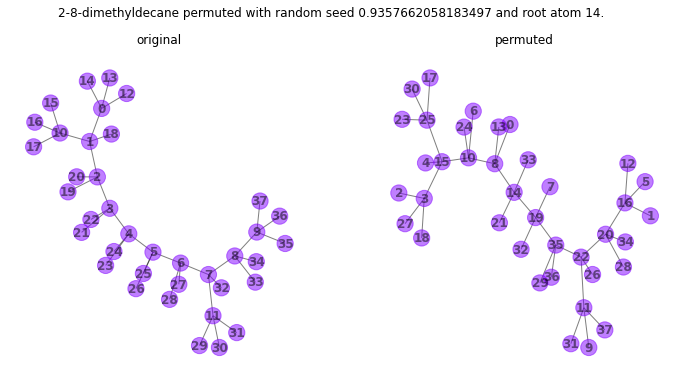

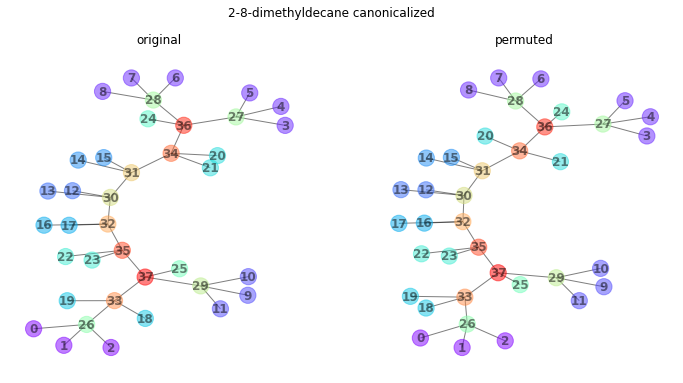

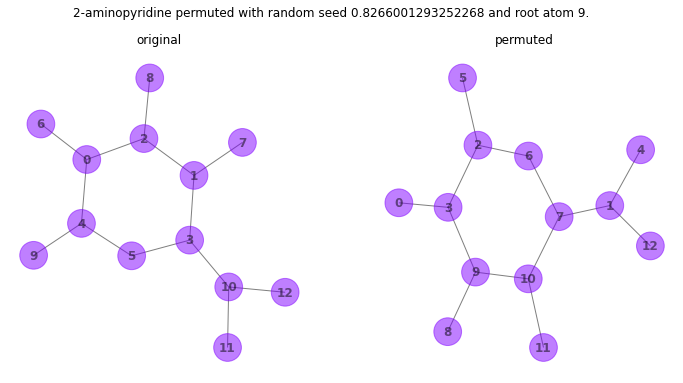

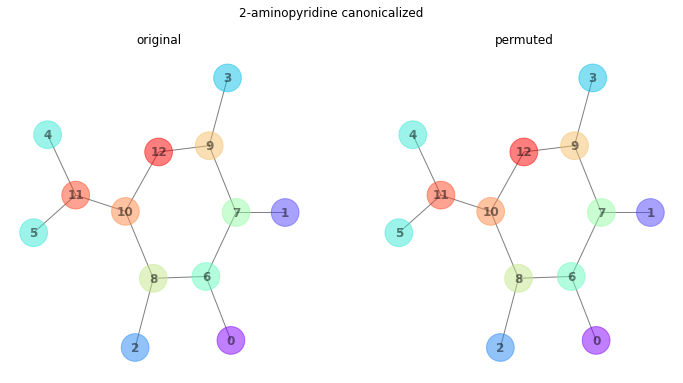

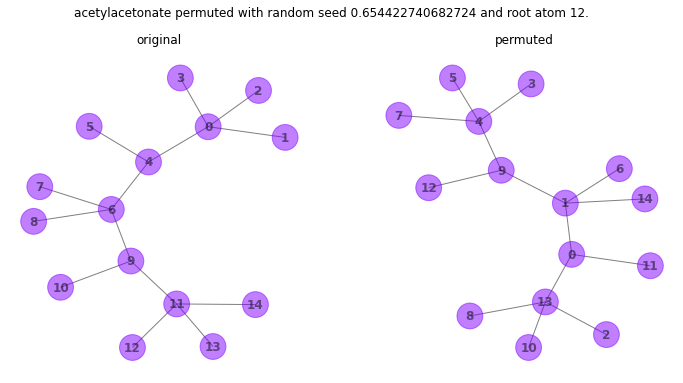

...

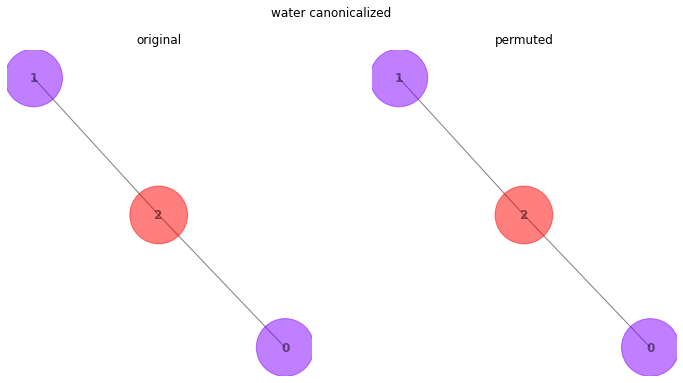

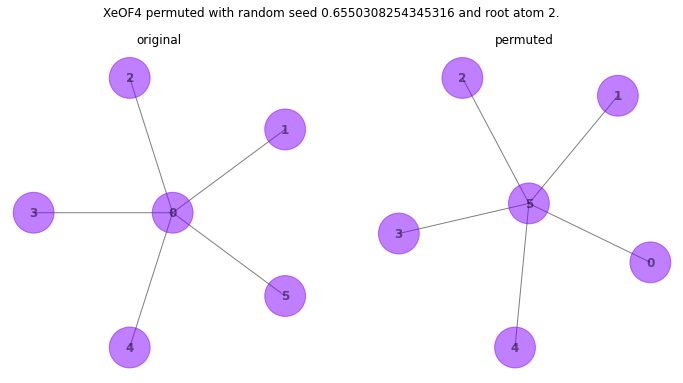

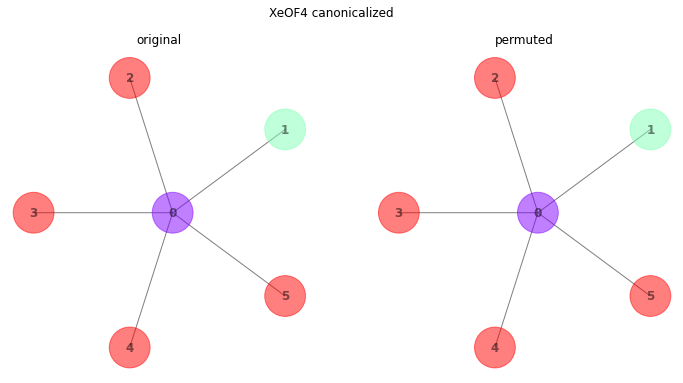

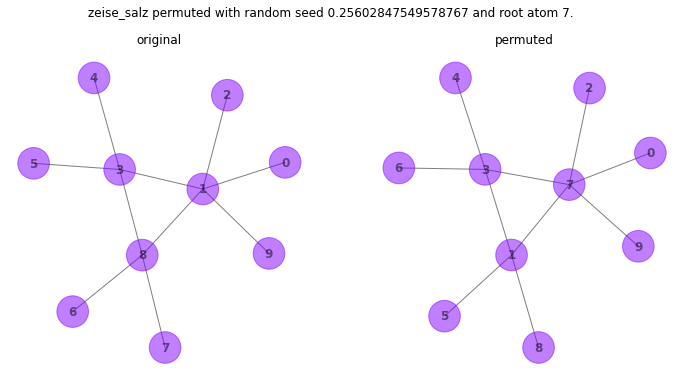

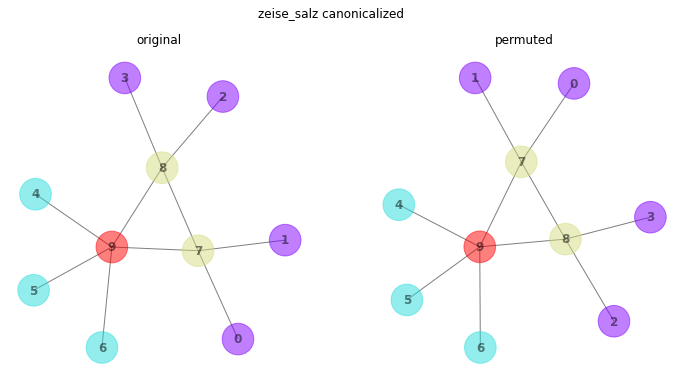

In [7]:
testfiles = list(Path(MOLFILEPATH).glob("*/*.mol"))

for molfile in testfiles:
    test_canonicalization_invariance(molfile, n_runs=1, visualize=True)